# Dog Breed Recognition

This project implements a deep learning model for automatic dog breed classification using a CNN (Convolutional Neural Network) and standard techniques for training, evaluation, and result visualization.

## Key Project Components

- **Dataset**: The **Stanford Dogs Dataset** is used. This dataset contains 20,580 images across 120 different dog breeds.
- **Data preprocessing**:
  - Splitting the dataset into training, validation, and test sets
  - Visualizing the number of images per class

## Environment Setup

### System Configuration
- **Operating System**: Windows 10
- **Python Version**: 3.8.10
- **Virtual Environment**: `py3810_env`

### GPU Configuration
- **GPU**: NVIDIA RTX 4060
- **Available VRAM**: 5,563 MB
- **CUDA**: Properly configured and compatible with the installed TensorFlow version
- **cuDNN**: Installed and injected into the environment

### Key Python Packages

#### Deep Learning & Machine Learning
- **TensorFlow 2.x** (with integrated Keras API)
- **scikit-learn** (used for evaluation metrics and confusion matrix visualization)

This environment setup ensures stable GPU-accelerated training and evaluation of deep learning models.


## Introduction

- Installing required packages
- Importing libraries and setting up the environment

In [ ]:
import os
import splitfolders
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shutil
import pandas as pd
import pathlib
import numpy as np
import urllib.request
import tarfile
import cv2
import scipy

In [ ]:
import os

cuda_path = os.path.join(os.getcwd(), 'py3810_env', 'Library', 'bin')
cuda_home = os.path.join(os.getcwd(), 'py3810_env', 'Library')

os.environ['CUDA_PATH'] = cuda_path
os.environ['CUDA_HOME'] = cuda_home
os.environ['PATH'] = cuda_path + os.pathsep + os.environ.get('PATH', '')

print("✓ CUDA/cuDNN paths configured")
print(f"  CUDA_PATH: {cuda_path}")
print(f"  CUDA_HOME: {cuda_home}")

✓ CUDA/cuDNN paths configured
  CUDA_PATH: c:\Users\DT User\Documents\ETF\Master\POOS\py3810_env\Library\bin
  CUDA_HOME: c:\Users\DT User\Documents\ETF\Master\POOS\py3810_env\Library


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input
import scipy 

### Defining the path to the original and target dataset folders

In [4]:
DATASET_BASE_PATH = './output_dataset_split'
original_dataset = './Images'
DATASET = './dataset'

## Dataset Analysis

Before training the model, it is important to analyze the structure and content of the dataset. In this phase:

- **Paths to all class folders** are collected, where each folder represents a **dog breed**
- The **number of images per folder** is computed to assess **class balance**
- A **plot showing the number of images per breed** is generated to visually identify potential **data imbalance**
- **Random samples of images** from the dataset are displayed along with their labels to verify **data quality and diversity**

This analysis helps in planning further steps, such as dataset balancing, data augmentation, and gaining a better understanding of the complexity of the classification task.

In [5]:
folders = [os.path.join(original_dataset, d) for d in os.listdir(original_dataset) if os.path.isdir(os.path.join(original_dataset, d))]

print(f"Found {len(folders)} dog breeds:")

Found 120 dog breeds:


In [6]:
for folder in folders:
    print(folder)

./Images\n02085620-Chihuahua
./Images\n02085782-Japanese_spaniel
./Images\n02085936-Maltese_dog
./Images\n02086079-Pekinese
./Images\n02086240-Shih-Tzu
./Images\n02086646-Blenheim_spaniel
./Images\n02086910-papillon
./Images\n02087046-toy_terrier
./Images\n02087394-Rhodesian_ridgeback
./Images\n02088094-Afghan_hound
./Images\n02088238-basset
./Images\n02088364-beagle
./Images\n02088466-bloodhound
./Images\n02088632-bluetick
./Images\n02089078-black-and-tan_coonhound
./Images\n02089867-Walker_hound
./Images\n02089973-English_foxhound
./Images\n02090379-redbone
./Images\n02090622-borzoi
./Images\n02090721-Irish_wolfhound
./Images\n02091032-Italian_greyhound
./Images\n02091134-whippet
./Images\n02091244-Ibizan_hound
./Images\n02091467-Norwegian_elkhound
./Images\n02091635-otterhound
./Images\n02091831-Saluki
./Images\n02092002-Scottish_deerhound
./Images\n02092339-Weimaraner
./Images\n02093256-Staffordshire_bullterrier
./Images\n02093428-American_Staffordshire_terrier
./Images\n02093647-B

In [7]:
data = []

for folder_path in folders:
    folder_name = os.path.basename(folder_path)
    cleaned_name = folder_name.split('-', 1)[-1]
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    data.append({
        'Dog breed': cleaned_name,
        'Number of pictures': len(image_files)
    })

df = pd.DataFrame(data)

df

,Dog breed,Number of pictures
0,Chihuahua,152
1,Japanese_spaniel,185
2,Maltese_dog,252
3,Pekinese,149
4,Shih-Tzu,214
...,...,...
115,standard_poodle,159
116,Mexican_hairless,155
117,dingo,156
118,dhole,150


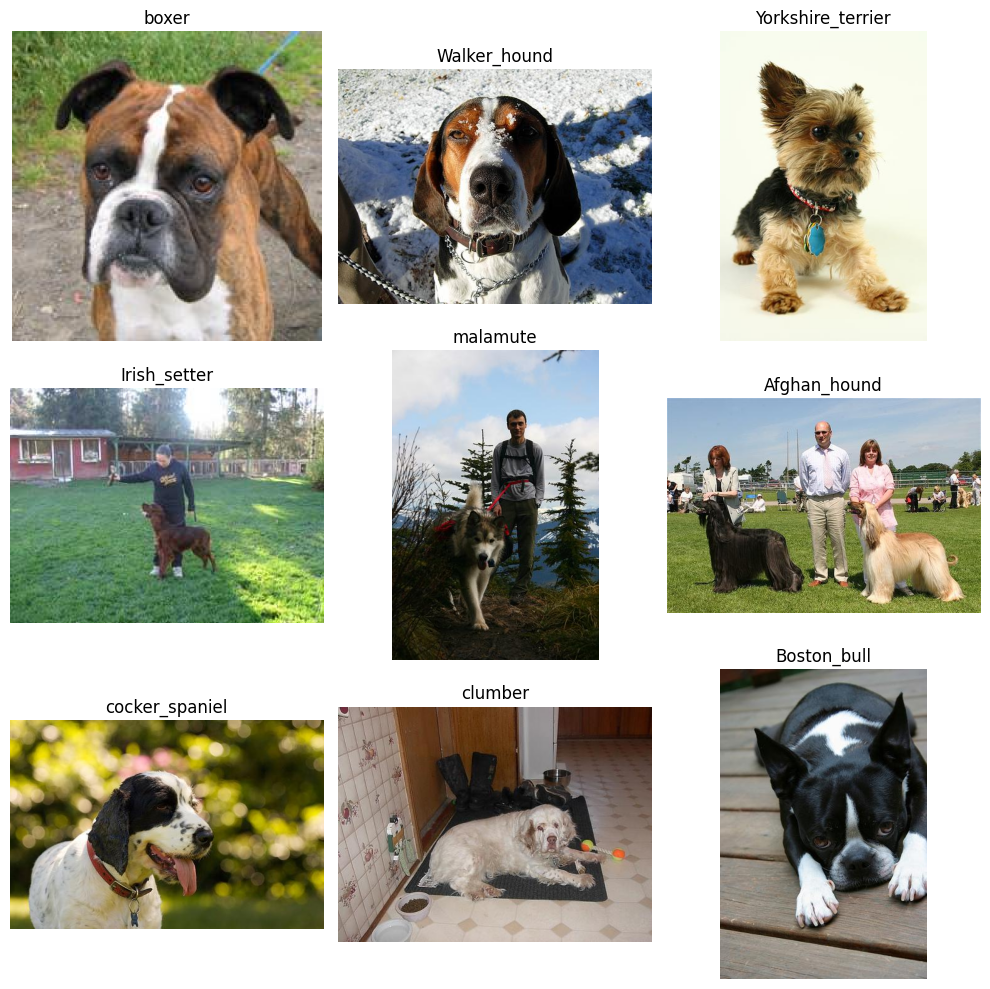

In [8]:
num_images_to_show = 9

selected_images = []

for folder in random.sample(folders, min(num_images_to_show, len(folders))):
    images = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if images:
        random_image = random.choice(images)
        selected_images.append(os.path.join(folder, random_image))

plt.figure(figsize=(10, 10))
for i, img_path in enumerate(selected_images):
    breed_folder = os.path.basename(os.path.dirname(img_path))
    cleaned_name = breed_folder.split('-', 1)[-1]
    img = mpimg.imread(img_path)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(cleaned_name)
    plt.axis('off')

plt.tight_layout()
plt.show()

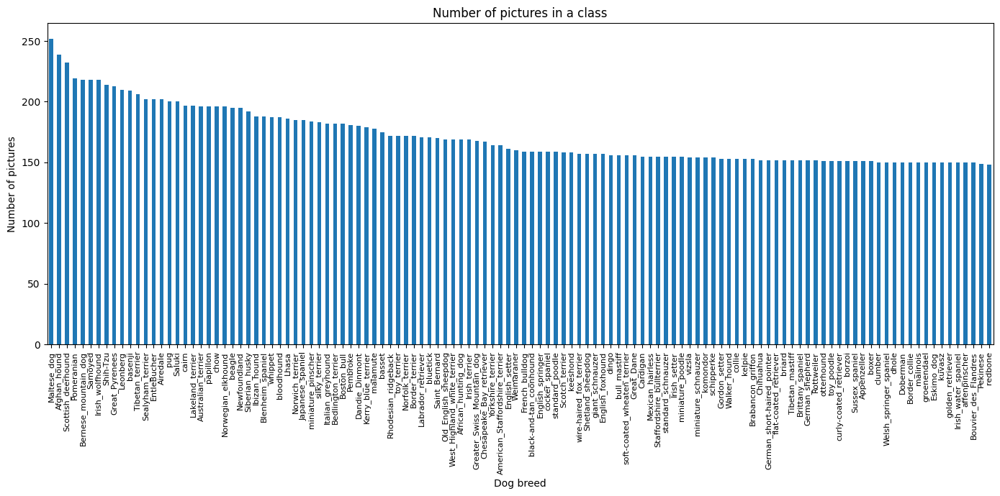

In [9]:
plt.figure(figsize=(14, 7))

df_sorted = df.sort_values(by="Number of pictures", ascending=False)

df_sorted.plot(kind="bar",
                     x="Dog breed",
                     y="Number of pictures",
                     legend=False,
                     ax=plt.gca())

plt.ylabel("Number of pictures")
plt.title("Number of pictures in a class")
plt.xticks(rotation=90,
           fontsize=8)
plt.tight_layout()
plt.show()

## Data Augmentation

Data augmentation was applied to improve model generalization by increasing the diversity of the training data while preserving class-specific features.

Several augmentation techniques were evaluated:

- **Gaussian blur and median filtering** were tested but found to be unsuitable. Since the Stanford Dogs dataset relies heavily on fine-grained visual details (fur texture, facial structure, ear shape), blurring operations removed important discriminative features and negatively affected performance.
- **Histogram equalization** was also experimented with, but it introduced excessive contrast changes and caused loss of subtle image details, leading to reduced classification accuracy.

The most effective augmentation strategy was found to be **photometric transformations**, including:
- Brightness adjustment
- Contrast variation
- Saturation modification

These transformations simulate realistic lighting conditions without altering the structural details of the images, allowing the model to become more robust while maintaining high classification performance.

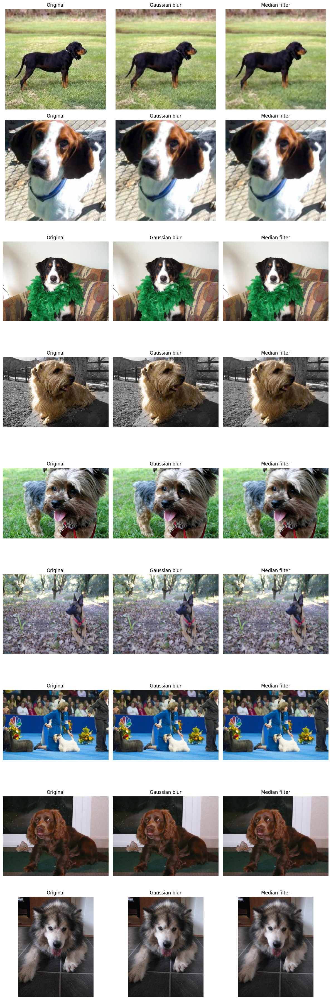

In [10]:
num_images_to_show = 9

selected_images = []

for folder in random.sample(folders, min(num_images_to_show, len(folders))):
    images = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if images:
        random_image = random.choice(images)
        selected_images.append(os.path.join(folder, random_image))

plt.figure(figsize=(12, 4 * num_images_to_show))

for idx, img_path in enumerate(selected_images):
    bgr = cv2.imread(img_path)
    if bgr is None:
        print(f"Can't load the picture: {img_path}")
        continue

    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gaussian = cv2.GaussianBlur(rgb, ksize=(3, 3), sigmaX=0.5)

    median = cv2.medianBlur(rgb, ksize=3)

    row = idx + 1

    # Original
    plt.subplot(num_images_to_show, 3, 3 * (row - 1) + 1)
    plt.imshow(rgb)
    plt.title("Original")
    plt.axis("off")

    # Gaussian blur
    plt.subplot(num_images_to_show, 3, 3 * (row - 1) + 2)
    plt.imshow(gaussian)
    plt.title("Gaussian blur")
    plt.axis("off")

    # Median filter
    plt.subplot(num_images_to_show, 3, 3 * (row - 1) + 3)
    plt.imshow(median)
    plt.title("Median filter")
    plt.axis("off")

plt.tight_layout()
plt.show()

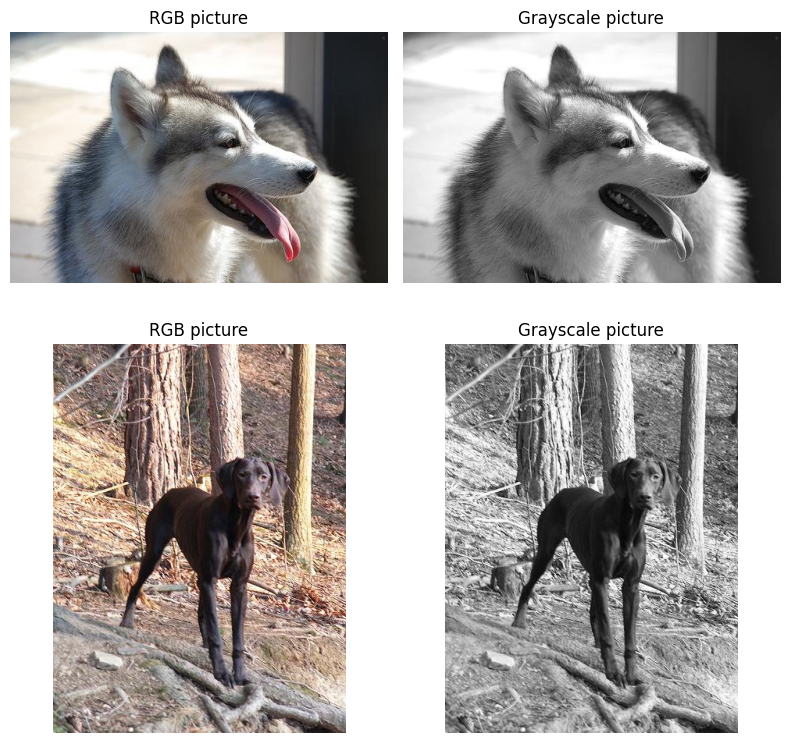

In [11]:
num_images_to_show = 2

selected_images = []

for folder in random.sample(folders, min(num_images_to_show, len(folders))):
    images = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if images:
        random_image = random.choice(images)
        selected_images.append(os.path.join(folder, random_image))

plt.figure(figsize=(8, 4 * num_images_to_show))

for idx, img_path in enumerate(selected_images):
    bgr = cv2.imread(img_path)
    if bgr is None:
        print(f"Can't load the picture: {img_path}")
        continue


    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)


    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)

    row = idx + 1


    plt.subplot(num_images_to_show, 2, 2 * (row - 1) + 1)
    plt.imshow(rgb)
    plt.title("RGB picture")
    plt.axis("off")


    plt.subplot(num_images_to_show, 2, 2 * (row - 1) + 2)
    plt.imshow(gray, cmap="gray")
    plt.title("Grayscale picture")
    plt.axis("off")

plt.tight_layout()
plt.show()

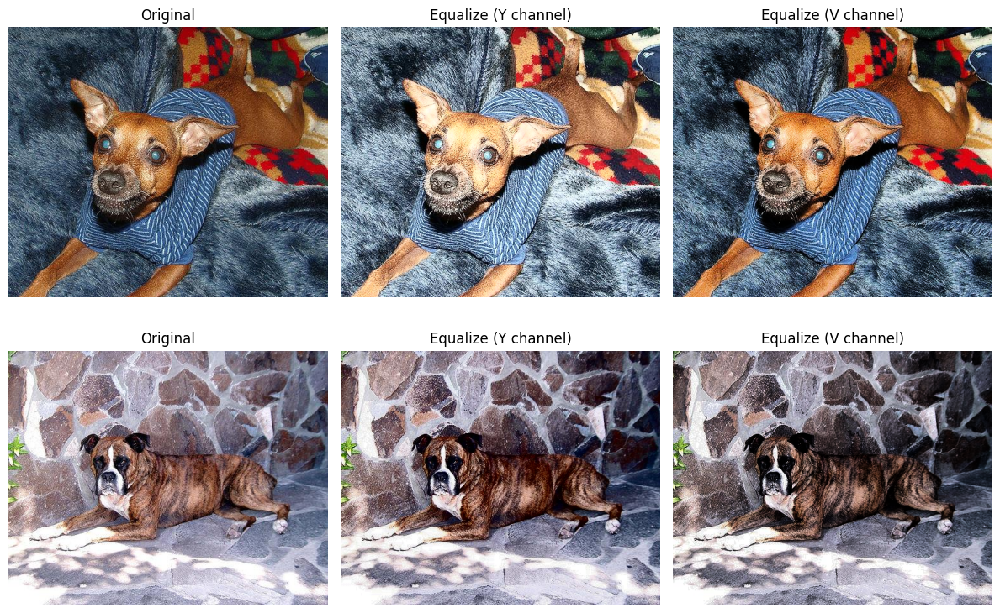

In [12]:
num_images_to_show = 2

selected_images = []

for folder in random.sample(folders, min(num_images_to_show, len(folders))):
    images = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if images:
        random_image = random.choice(images)
        selected_images.append(os.path.join(folder, random_image))

plt.figure(figsize=(12, 4 * num_images_to_show))

for idx, img_path in enumerate(selected_images):
    bgr = cv2.imread(img_path)
    if bgr is None:
        print(f"Can't load the picture: {img_path}")
        continue

    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    ycrcb = cv2.cvtColor(bgr, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)
    y_eq = cv2.equalizeHist(y)
    ycrcb_eq = cv2.merge((y_eq, cr, cb))
    rgb_eq = cv2.cvtColor(cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2BGR), cv2.COLOR_BGR2RGB)

    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v_eq = cv2.equalizeHist(v)
    hsv_eq = cv2.merge((h, s, v_eq))
    rgb_hsv_eq = cv2.cvtColor(cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2BGR), cv2.COLOR_BGR2RGB)

    row = idx + 1

    plt.subplot(num_images_to_show, 3, 3*(row-1) + 1)
    plt.imshow(rgb); plt.title("Original"); plt.axis("off")

    plt.subplot(num_images_to_show, 3, 3*(row-1) + 2)
    plt.imshow(rgb_eq); plt.title("Equalize (Y channel)"); plt.axis("off")

    plt.subplot(num_images_to_show, 3, 3*(row-1) + 3)
    plt.imshow(rgb_hsv_eq); plt.title("Equalize (V channel)"); plt.axis("off")

plt.tight_layout()
plt.show()

In [13]:
def random_brightness_contrast(img, brightness_range=(-0.2, 0.2), contrast_range=(0.8, 1.2)):
    alpha = random.uniform(*contrast_range)
    beta = random.uniform(brightness_range[0] * 255, brightness_range[1] * 255)
    out = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
    return out

def random_increase_saturation_rgb(img, s_mult_range=(1.1, 1.3)):

    hsv = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2HSV).astype(np.float32)
    h, s, v = cv2.split(hsv)

    s_mult = random.uniform(*s_mult_range)
    s *= s_mult
    s = np.clip(s, 0, 255)

    hsv = cv2.merge([h, s, v]).astype(np.uint8)

    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB).astype(np.float32)

    return rgb

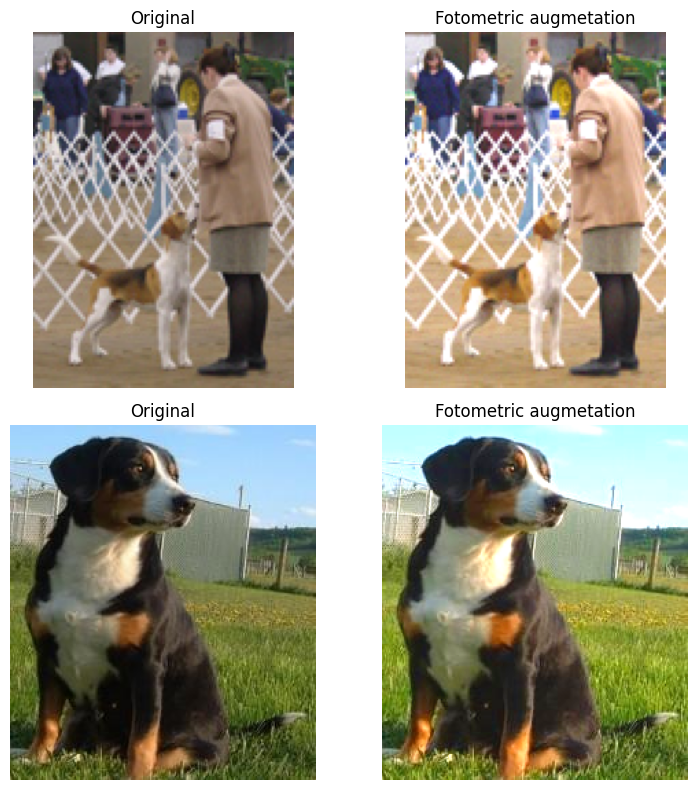

In [ ]:
num_images_to_show = 2
selected_images = []

for folder in random.sample(folders, min(num_images_to_show, len(folders))):
    images = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if images:
        random_image = random.choice(images)
        selected_images.append(os.path.join(folder, random_image))

plt.figure(figsize=(8, 4 * num_images_to_show))

for idx, img_path in enumerate(selected_images):
    bgr = cv2.imread(img_path)
    if bgr is None:
        print(f"Can't load the picture: {img_path}")
        continue

    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    aug = bgr.copy()

    aug = random_brightness_contrast(aug,
                                     brightness_range=(0.02, 0.08),
                                     contrast_range=(1.15, 1.35))

    aug = random_increase_saturation_rgb(aug, s_mult_range=(1.1, 1.3))



    rgb_aug = cv2.cvtColor(aug, cv2.COLOR_BGR2RGB)
    row = idx + 1

    plt.subplot(num_images_to_show, 2, 2 * (row - 1) + 1)
    plt.imshow(rgb)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(num_images_to_show, 2, 2 * (row - 1) + 2)
    plt.imshow(rgb_aug.astype(np.uint8))
    plt.title("Fotometric augmetation")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [15]:
def my_preprocess(img):
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8) if img.max() <= 1.0 else img.astype(np.uint8)
    
    img = random_brightness_contrast(img,
                                         brightness_range=(0.02, 0.08),
                                         contrast_range=(1.15, 1.35))

    img = random_increase_saturation_rgb(img,
                                         s_mult_range=(1.1, 1.3))

    img = img.astype(np.uint8)
    img = preprocess_input(img)

    return img

## Dataset Split into Training, Validation, and Test Sets

To properly train and evaluate the model, the original dataset needs to be divided into three parts:

- **Training set (train)** – used for learning the model parameters
- **Validation set (val)** – used to monitor performance during training and prevent overfitting
- **Test set (test)** – used for final model evaluation after training

For this purpose, the **`splitfolders`** library is used, which enables automatic folder-based splitting according to specified proportions.

This step is crucial because it ensures that the model is **trained, validated, and tested** on **different data**, allowing for an objective evaluation of its accuracy and generalization capability.

In [ ]:
#------------------------ Only run on first try -----------------------#
"""
splitfolders.ratio(
     original_dataset,
     output=DATASET,
     seed=42,
     ratio=(.7, .15, .15),
     move=False
)"""

'\nsplitfolders.ratio(\n     original_dataset,\n     output=DATASET,\n     seed=42,\n     ratio=(.7, .15, .15),\n     move=False\n)'

In [17]:
train_dir = os.path.join(DATASET, 'train')
val_dir = os.path.join(DATASET, 'val')
test_dir = os.path.join(DATASET, 'test')

## Data Loading and Preparation (`ImageDataGenerator`)

In this phase, images are prepared for model training using `ImageDataGenerator`. This approach enables easy data augmentation and loading of images from directories where classes are organized into folders.

### 1. Training Set Augmentation
For the training set, `ImageDataGenerator` is used with several augmentations to improve model generalization:
- Image rotation up to 30°
- Horizontal shifting (±20%)
- Vertical shifting (±20%)
- Shear transformation and zooming
- Horizontal flipping (`flip`)
- Custom preprocessing function `my_preprocess` (pixel normalization, brightness, contrast, and saturation)

### 2. Validation and Test Sets
For validation and testing, the same `preprocess_input` function is applied, but **without augmentation**, as the data should remain in its original form.

### 3. Directory Structure
Images are organized into class-based directories (`train`, `val`, `test`), where each class corresponds to a subdirectory named after the class.

### 4. Generator Creation
The `flow_from_directory()` method is used to create generators that automatically:
- Load images from folders
- Resize them to the specified `IMG_SIZE`
- Generate one-hot encoded labels based on folder names
- Optionally shuffle the data

> This step ensures that all data is standardized, augmented, and ready for model training.

In [18]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 128

In [19]:
train_datagen = ImageDataGenerator(
   preprocessing_function=my_preprocess,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
)
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)


train_gen = train_datagen.flow_from_directory(
   train_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
   class_mode='categorical', shuffle=True
)
val_gen = val_datagen.flow_from_directory(
   val_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
   class_mode='categorical', shuffle=False
)
test_gen = test_datagen.flow_from_directory(
   test_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
   class_mode='categorical', shuffle=False
)

Found 14355 images belonging to 120 classes.
Found 3025 images belonging to 120 classes.
Found 3200 images belonging to 120 classes.


In [ ]:
import scipy
import scipy.ndimage as ndimage
from scipy import ndimage as scipy_ndimage
import keras.preprocessing.image as kpi

kpi.scipy = scipy
kpi.ndimage = ndimage

print("✓ SciPy and ndimage injected into Keras - augmentations ready!")

✓ SciPy and ndimage injected into Keras - augmentations ready!


## Model Definition

For dog breed classification, a **transfer learning approach** is used with the pre-trained **EfficientNetB0** model.

### Base Model: EfficientNetB0
- A version pre-trained on the **ImageNet** dataset is used (`weights='imagenet'`)
- The `include_top=False` argument removes the original classification layers so custom layers can be added
- Setting `base_model.trainable = False` means that **the base model weights are frozen** and used only as a feature extractor

### Custom Top Layers
- `GlobalAveragePooling2D`: compresses the extracted feature maps into a single feature vector
- `Dropout(0.5)`: helps prevent overfitting by randomly disabling neurons during training
- `Dense`: final classification layer with `softmax` activation for predicting `NUM_CLASSES` classes

### Callbacks Used
- `EarlyStopping`: stops training if the validation loss does not improve after a defined number of epochs (`patience`) and restores the best model weights
- `ReduceLROnPlateau`: reduces the learning rate when the model plateaus (no improvement in validation loss), enabling more stable convergence
- `TensorBoard`: allows detailed monitoring of training and validation metrics through a graphical interface

This model structure leverages the power of pre-trained networks while maintaining flexibility by training only the layers necessary for the specific classification task.

In [21]:
EPOCHS = 10
NUM_CLASSES = 120
PATIENCE = 2
BASE_LR = 1e-3

In [22]:
base_model = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=IMG_SIZE + (3,)
)
base_model.trainable = False

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax', dtype='float32')(x)
model = models.Model(inputs, outputs)

cbs = [
    callbacks.EarlyStopping(monitor='val_loss', patience=PATIENCE, restore_best_weights=True),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=PATIENCE),
    callbacks.TensorBoard(log_dir='logs')
]


## Model Training

In this phase, only the newly added top layers of the model are trained, while the **EfficientNetB0 base model remains frozen** (`trainable = False`).

### Objective
- Train the classifier layers (Dense layers) to correctly recognize dog breeds using features extracted by the base model.

### Training Details
- **Optimizer**: Adam with learning rate `BASE_LR`
- **Loss function**: Categorical Crossentropy (multi-class classification)
- **Evaluation metric**: Accuracy (`accuracy`)
- **Callbacks**: EarlyStopping, ReduceLROnPlateau

After training, the model is evaluated on the test set, and the **test accuracy and loss** are reported.

In [24]:
model.compile(
    optimizer=optimizers.Adam(learning_rate=BASE_LR),
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

print("=" * 50)
print("Starting GPU-optimized training...")
print("=" * 50)

# Explicitly use GPU for training
with tf.device('/GPU:0'):
    history_head = model.fit(
        train_gen,
        epochs=EPOCHS,
        validation_data=val_gen,
        callbacks=cbs,
    )

Starting GPU-optimized training...
Epoch 1/10
113/113 [==============================] - 125s 1s/step - loss: 2.7787 - accuracy: 0.4215 - val_loss: 1.2282 - val_accuracy: 0.7666 - lr: 0.0010
Epoch 2/10
113/113 [==============================] - 118s 1s/step - loss: 1.2975 - accuracy: 0.6864 - val_loss: 0.7862 - val_accuracy: 0.8060 - lr: 0.0010
Epoch 3/10
113/113 [==============================] - 116s 1s/step - loss: 1.0204 - accuracy: 0.7317 - val_loss: 0.6597 - val_accuracy: 0.8228 - lr: 0.0010
Epoch 4/10
113/113 [==============================] - 116s 1s/step - loss: 0.8984 - accuracy: 0.7511 - val_loss: 0.6002 - val_accuracy: 0.8291 - lr: 0.0010
Epoch 5/10
113/113 [==============================] - 120s 1s/step - loss: 0.8205 - accuracy: 0.7692 - val_loss: 0.5687 - val_accuracy: 0.8370 - lr: 0.0010
Epoch 6/10
113/113 [==============================] - 118s 1s/step - loss: 0.7708 - accuracy: 0.7736 - val_loss: 0.5479 - val_accuracy: 0.8374 - lr: 0.0010
Epoch 7/10
113/113 [=========

In [25]:
base_model.trainable = True
for layer in base_model.layers[:-50]:
    layer.trainable = False

model.compile(
    optimizer=optimizers.Adam(learning_rate=BASE_LR*0.1),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_fine = model.fit(
    train_gen,
    epochs = EPOCHS,
    validation_data=val_gen,
    callbacks=cbs
)


test_loss, test_accuracy = model.evaluate(test_gen)
print(f"Accuracy test: {test_accuracy:.2%}")
print(f"Loss test: {test_loss:.4f}")

Epoch 1/10
113/113 [==============================] - 116s 988ms/step - loss: 0.6000 - accuracy: 0.8136 - val_loss: 0.5019 - val_accuracy: 0.8383 - lr: 1.0000e-04
Epoch 2/10
113/113 [==============================] - 112s 988ms/step - loss: 0.5351 - accuracy: 0.8320 - val_loss: 0.5140 - val_accuracy: 0.8347 - lr: 1.0000e-04
Epoch 3/10
25/25 [==============================] - 5s 190ms/step - loss: 0.5251 - accuracy: 0.8366
Accuracy test: 83.66%
Loss test: 0.5251


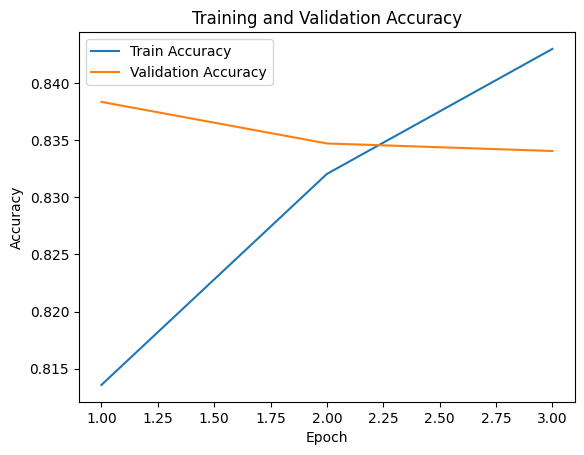

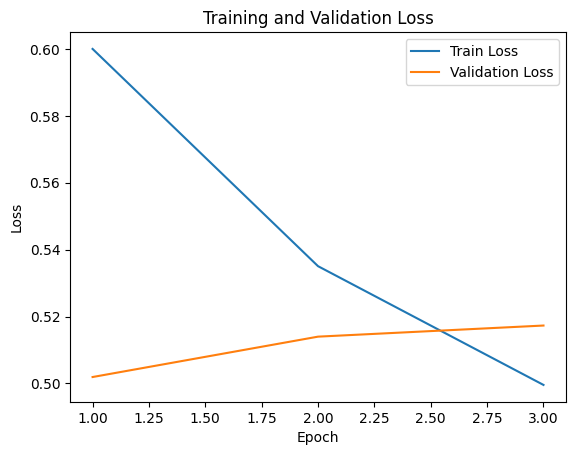

In [ ]:
acc       = history_fine.history['accuracy']
val_acc   = history_fine.history['val_accuracy']
loss      = history_fine.history['loss']
val_loss  = history_fine.history['val_loss']
epochs    = range(1, len(acc) + 1)

plt.figure()
plt.plot(epochs, acc,     label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure()
plt.plot(epochs, loss,     label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Final Model Evaluation on the Test Set (Loss, Accuracy, and Visualizations)

In this section:
- The model is evaluated on the test set (loss and accuracy)
- Predictions are generated for the test data
- Model performance is visualized using a confusion matrix and examples of correct and incorrect predictions

In [68]:
test_results = model.evaluate(test_gen, verbose=1)

print("Test results:")
for name, val in zip(model.metrics_names, test_results):
    print(f"{name}: {val:.6f}")

25/25 [==============================] - 7s 248ms/step - loss: 0.5251 - accuracy: 0.8366
Test results:
loss: 0.525121
accuracy: 0.836563


In [55]:
y_prob = model.predict(test_gen, verbose=1)
y_true = test_gen.classes                  # true label index
y_pred = np.argmax(y_prob, axis=1)         # predicted label index

print("y_prob shape:", y_prob.shape)
print("y_true shape:", y_true.shape)
print("y_pred shape:", y_pred.shape)

25/25 [==============================] - 8s 256ms/step
y_prob shape: (3200, 120)
y_true shape: (3200,)
y_pred shape: (3200,)


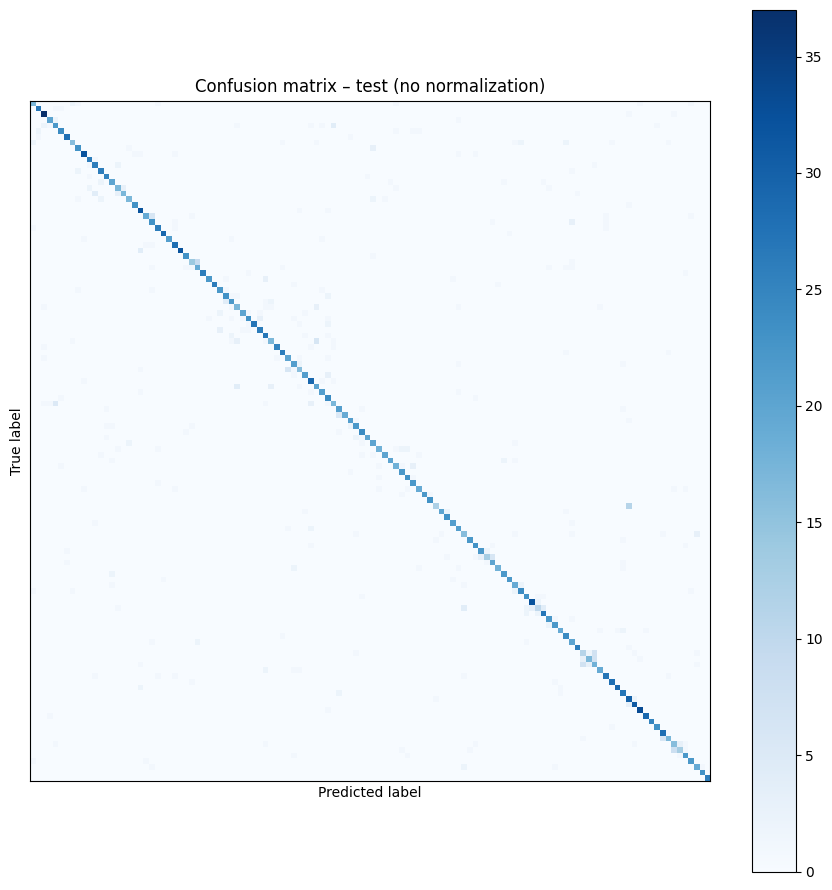

In [60]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


cm_raw = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(9, 9))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_raw)
disp.plot(ax=ax, cmap="Blues", colorbar=True, values_format=None, include_values=False)

ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel("Predicted label")
ax.set_ylabel("True label")
ax.set_title("Confusion matrix – test (no normalization)")

plt.tight_layout()
plt.show()

Correct predictions: 2677
False predictions: 523


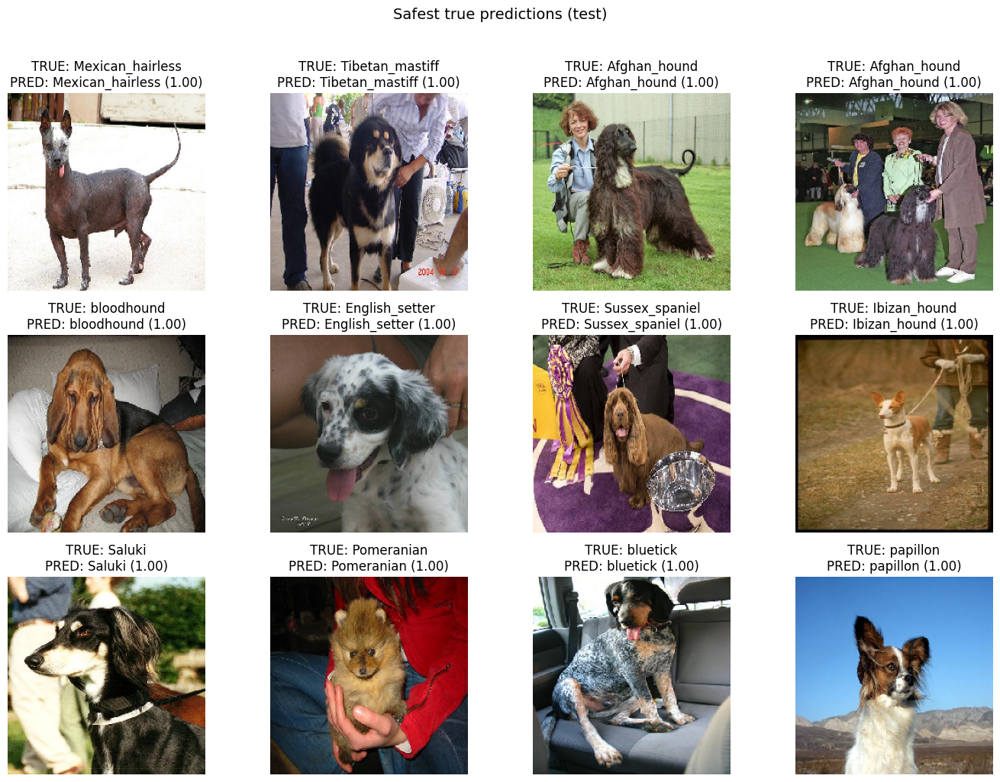

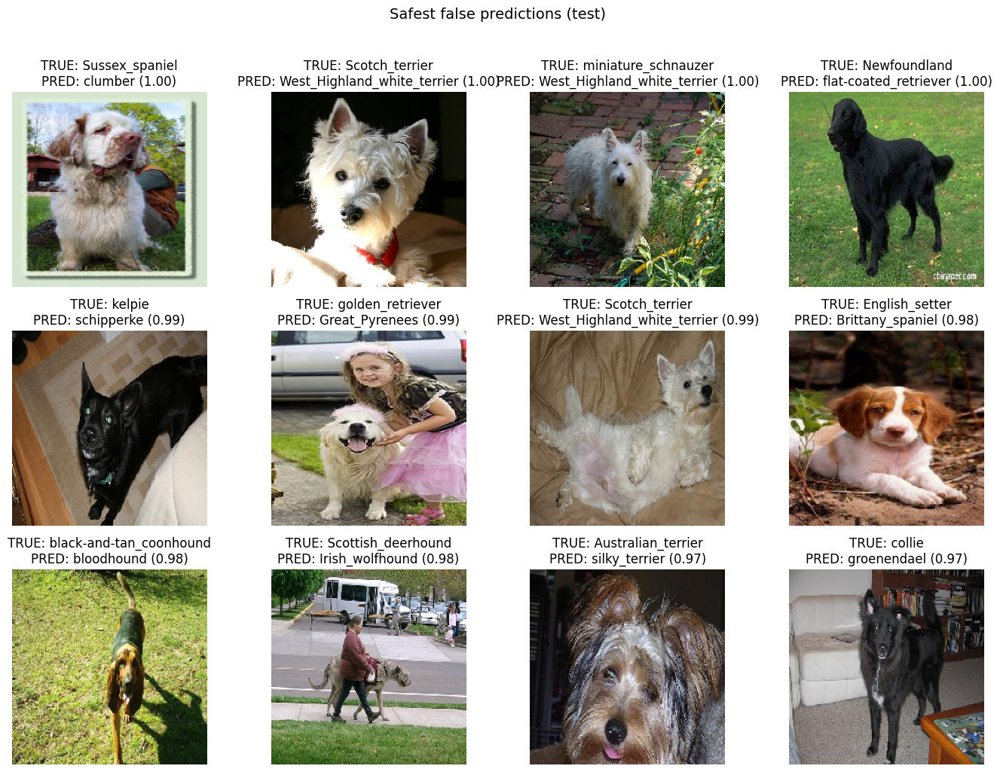

In [61]:
from tensorflow.keras.utils import load_img

# Get class names from test directory
class_names = sorted([d for d in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, d))])
class_names = [name.split('-', 1)[-1] if '-' in name else name for name in class_names]

filepaths = np.array(test_gen.filepaths)
conf = np.max(y_prob, axis=1)

correct_idx = np.where(y_pred == y_true)[0]
wrong_idx   = np.where(y_pred != y_true)[0]

print("Correct predictions:", len(correct_idx))
print("False predictions:", len(wrong_idx))

def show_examples(indices, title, n=12):
    n = min(n, len(indices))
    plt.figure(figsize=(14, 10))
    for i, idx in enumerate(indices[:n], 1):
        img = load_img(filepaths[idx], target_size=IMG_SIZE)
        plt.subplot(3, 4, i)
        plt.imshow(img)
        plt.axis("off")
        plt.title(
            f"TRUE: {class_names[y_true[idx]]}\n"
            f"PRED: {class_names[y_pred[idx]]} ({conf[idx]:.2f})"
        )
    plt.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()

if len(correct_idx) > 0:
    pick_correct = correct_idx[np.argsort(-conf[correct_idx])]
    show_examples(pick_correct, "Safest true predictions (test)", n=12)

if len(wrong_idx) > 0:
    pick_wrong = wrong_idx[np.argsort(-conf[wrong_idx])]
    show_examples(pick_wrong, "Safest false predictions (test)", n=12)
else:
    print("No false predictions on test set.")

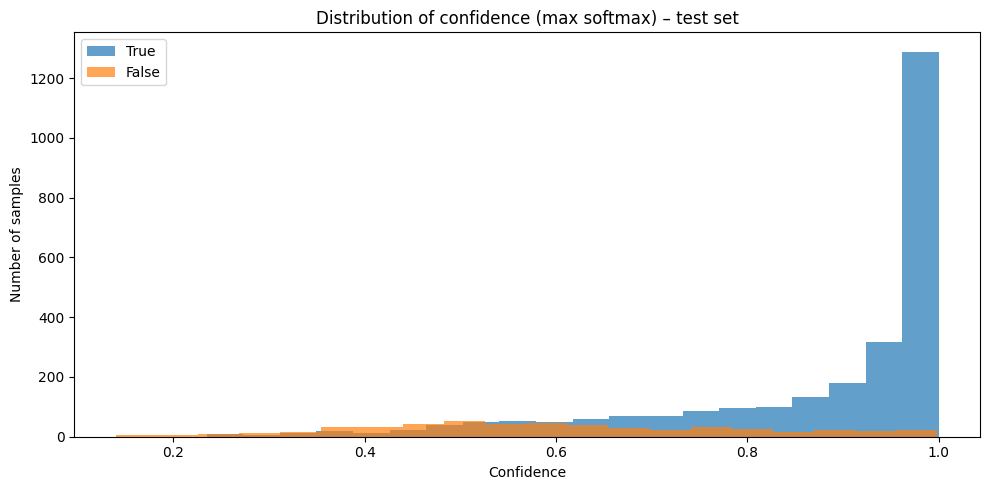

In [62]:
plt.figure(figsize=(10, 5))
plt.hist(conf[correct_idx], bins=20, alpha=0.7, label="True")
if len(wrong_idx) > 0:
    plt.hist(conf[wrong_idx], bins=20, alpha=0.7, label="False")
plt.title("Distribution of confidence (max softmax) – test set")
plt.xlabel("Confidence")
plt.ylabel("Number of samples")
plt.legend()
plt.tight_layout()
plt.show()

## GUI for Dog Breed Prediction Using the Trained Model

In [63]:
%pip install -q gradio nest_asyncio
import nest_asyncio

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import gradio as gr
nest_asyncio.apply()
gr.close_all()

def predict_dog_breed(img):
    if img is None:
        return None


    img = tf.image.resize(img, (224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    prediction = model.predict(img_array)[0]

    confidences = {clean_labels[i]: float(prediction[i]) for i in range(len(clean_labels))}
    return confidences

demo = gr.Interface(
    fn=predict_dog_breed,
    inputs=gr.Image(label="Insert dog image here"),
    outputs=gr.Label(num_top_classes=3, label="Predicted dog breed"),
    title="Dog Breed Recognition",
    description="Upload an image of a dog, and the model will predict its breed."
)

share_url, local_url, _ = demo.launch(share=True, inline=False, debug=False)

Closing server running on port: 7860
Running on local URL:  http://127.0.0.1:7860

Could not create share link. Please check your internet connection or our status page: https://status.gradio.app.
